Exploration and pre-processing

In this notebook:

- loading of csv files with text data, unique product and image ids
    - designation: title and short text summary
-   description: more detailed text to describe the product
-   productid: unique ID for the product
-   imageid: unique ID linking it to the image

- extraction of images from image folder is structured via: image_imageid_product_productid.jpg



# Import modules

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import cv2

from openai import OpenAI
from transformers import pipeline
from langdetect import detect
from langdetect.lang_detect_exception import LangDetectException

from tqdm.auto import tqdm
tqdm.pandas()

api_key = os.getenv("OPENAI_API_KEY") # load the API key from environment variable
print("API Key loaded:", api_key is not None) # check if the API key is loaded
client = OpenAI(api_key=api_key)

# ---- GLOBAL PLOT SETTINGS ----

# for converting cm to inches
cm = 1/2.54

# Set global plot style
plt.rcParams.update({
    "figure.figsize": (18*cm, 8*cm),   # default: 18×8 cm
    "font.size": 10,                    # Standardschriftgröße
    "axes.titlesize": 10,
    "axes.labelsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.dpi": 300, # für saubere Notebooks/Export
    "lines.linewidth": 1.0,
    "lines.markersize": 4,
    "axes.linewidth": 1.0,
    "xtick.major.width": 1.0,
    "ytick.major.width": 1.0,
    "xtick.minor.width": 1.0,
    "ytick.minor.width": 1.0,
})

c:\Users\Taoufiq\OneDrive\ML_Engineer\rakuten_challenge\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


API Key loaded: True


# Read and display data

In [2]:
# ---- LOAD DATA ----
df_X = pd.read_csv('data/X_train_update.csv',index_col=0)
display(df_X.head())

df_y = pd.read_csv('data/Y_train_CVw08PX.csv',index_col=0)
display(df_y.head())

print(f"Shape of X: {df_X.shape}")
print(f"Shape of y: {df_y.shape}")

from IPython.display import HTML
HTML(df_X.head().to_html())

,designation,description,productid,imageid
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786


,prdtypecode
0,10
1,2280
2,50
3,1280
4,2705


Shape of X: (84916, 4)
Shape of y: (84916, 1)


,designation,description,productid,imageid
0,Olivia: Personalisiertes Notizbuch / 150 Seiten / Punktraster / Ca Din A5 / Rosen-Design,NaN,3804725264,1263597046
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L'art Et Son Marche Salon D'art Asiatique A Paris - Jacques Barrere - Francois Perrier - La Reforme Des Ventes Aux Encheres Publiques - Le Sna Fete Ses Cent Ans.,NaN,436067568,1008141237
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo Wii U - Speedlink Pilot Style,"PILOT STYLE Touch Pen de marque Speedlink est 1 stylet ergonomique pour GamePad Nintendo Wii U.<br> Pour un confort optimal et une précision maximale sur le GamePad de la Wii U: ce grand stylet hautement ergonomique est non seulement parfaitement adapté à votre main mais aussi très élégant.<br> Il est livré avec un support qui se fixe sans adhésif à l'arrière du GamePad<br> <br> Caractéristiques:<br> Modèle: Speedlink PILOT STYLE Touch Pen<br> Couleur: Bleu<br> Ref. Fabricant: SL-3468-BE<br> Compatibilité: GamePad Nintendo Wii U<br> Forme particulièrement ergonomique excellente tenue en main<br> Pointe à revêtement longue durée conçue pour ne pas abîmer l'écran tactile<br> En bonus : Support inclu pour GamePad<br> <span class=""vga_style2""><b></b><br>",201115110,938777978
3,Peluche Donald - Europe - Disneyland 2000 (Marionnette À Doigt),NaN,50418756,457047496
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut organiser un jeu de guerre de boules de neige et s'arranger pour en &ecirc;tre le vainqueur incontest&eacute;. Mais Sophie s'en m&ecirc;le et chambarde tous ses plans...,278535884,1077757786


# Organization of data
- put everything in one df "df" for now just for exploration

In [3]:
# merge X and y into one dataframe for easier analysis
df = df_X.merge(df_y, left_index=True, right_index=True)
# display(df.head())

# Information about the dataset

print("Dataset Information:\n")
print(df.info())

print("\nDataset Description:\n")
# display(df.describe())

# print the number of nan values in each column
print(df.isna().sum())


Dataset Information:

<class 'pandas.core.frame.DataFrame'>
Index: 84916 entries, 0 to 84915
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   designation  84916 non-null  object
 1   description  55116 non-null  object
 2   productid    84916 non-null  int64 
 3   imageid      84916 non-null  int64 
 4   prdtypecode  84916 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 3.9+ MB
None

Dataset Description:

designation        0
description    29800
productid          0
imageid            0
prdtypecode        0
dtype: int64


In [4]:
# add a new column "image_file" to df which contains the image file name

df['image_file'] = 'image_' + df['imageid'].astype(str) + '_product_' + df['productid'].astype(str) + '.jpg'
# remove the productid and imageid columns
# df = df.drop(columns=['productid', 'imageid'])
display(df.head())

,designation,description,productid,imageid,prdtypecode,image_file
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10,image_1263597046_product_3804725264.jpg
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,2280,image_1008141237_product_436067568.jpg
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50,image_938777978_product_201115110.jpg
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280,image_457047496_product_50418756.jpg
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705,image_1077757786_product_278535884.jpg


# Data overview

## get an image, text fields and prdtypecode, based on the index

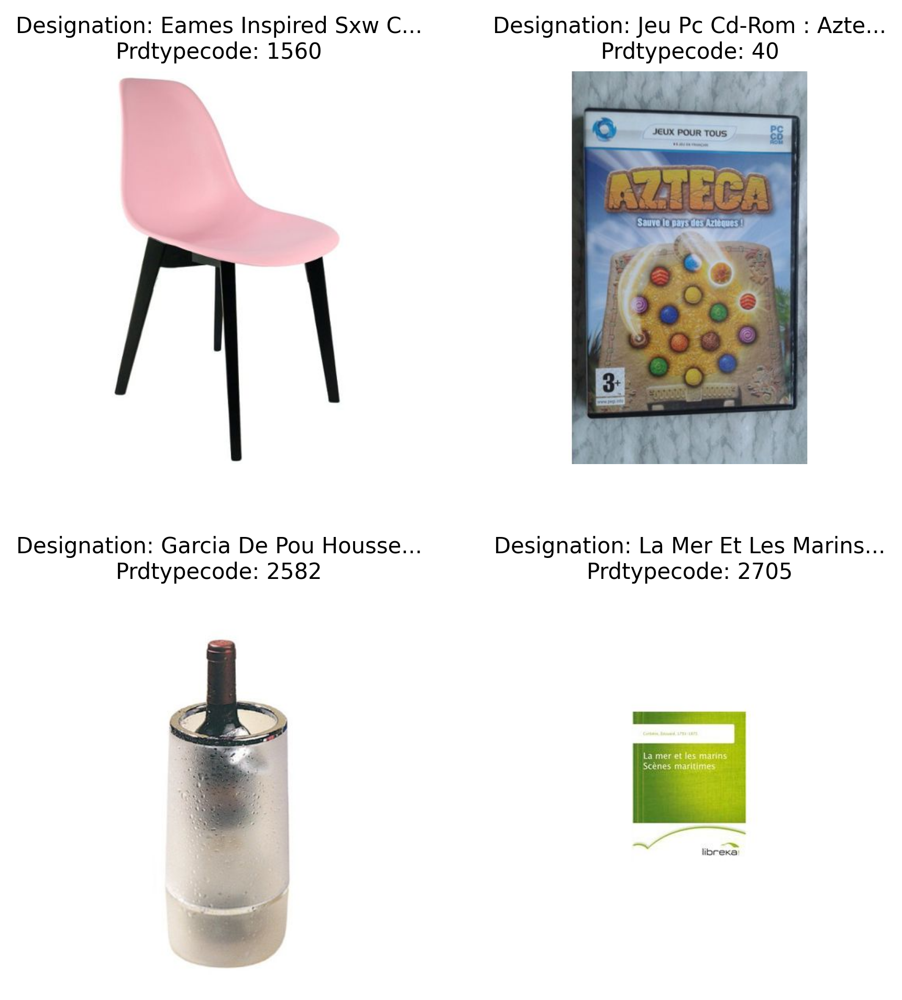

In [71]:


# display six images from the dataset along with their designation and prdtypecode in one figure
image_folder = 'data/images/images/image_train/'
product_idx = [10, 50, 100, 150]

plt.figure(figsize=(18*cm, 20*cm))
for i, idx in enumerate(product_idx):
    sample_image_file = df['image_file'].iloc[idx]
    image_path = os.path.join(image_folder, sample_image_file)

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.subplot(2,2, i+1)
    plt.imshow(image)
    # break the title into two lines
    designation = df['designation'].iloc[idx]
    prdtypecode = df['prdtypecode'].iloc[idx]
    plt.title(f"Designation: {designation[:20]}...\nPrdtypecode: {prdtypecode}",fontsize=10)
    
    # add sublabels (a), (b), (c), (d)
    # plt.text(0, 1, f"({chr(97+i)})", transform=plt.gca().transAxes, fontsize=12, fontweight='bold', va='top', ha='left')
    
    plt.axis('off')




## Raw data overview

### class imbalance

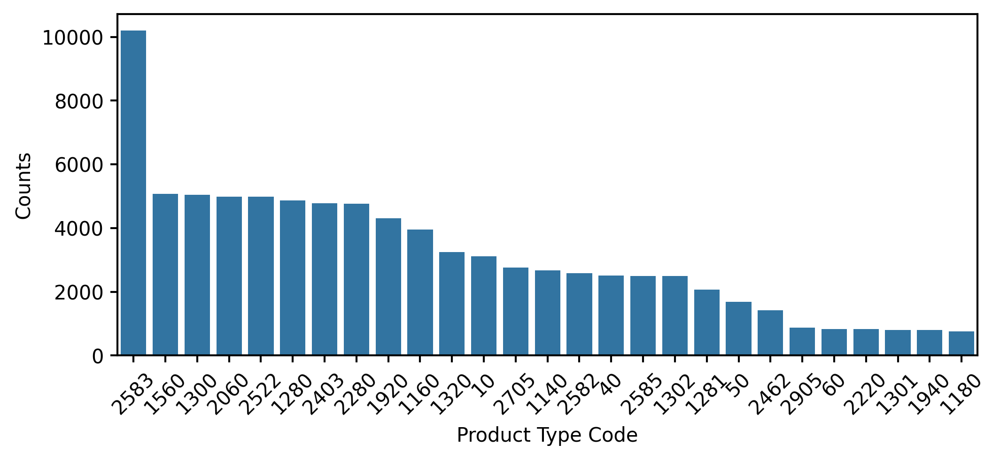

764
Ratio between most common and least common prdtypecode: 13.36


In [56]:
## display the producttype code distribution and make the x labels 45 degrees
# sorted by count descending
plt.figure(figsize=(20*cm,8*cm))
sns.countplot(data=df, x='prdtypecode', order=df['prdtypecode'].value_counts().index)
# plt.title('Product Type Code Distribution')
plt.xlabel('Product Type Code')
plt.ylabel('Counts')
plt.xticks(rotation=45)
plt.show()

# print ratio between most common and least common prdtypecode
prdtypecode_counts = df['prdtypecode'].value_counts()
most_common_count = prdtypecode_counts.iloc[0]
least_common_count = prdtypecode_counts.iloc[-1]
ratio = most_common_count / least_common_count
print(least_common_count)
print(f"Ratio between most common and least common prdtypecode: {ratio:.2f}")

### nan values text

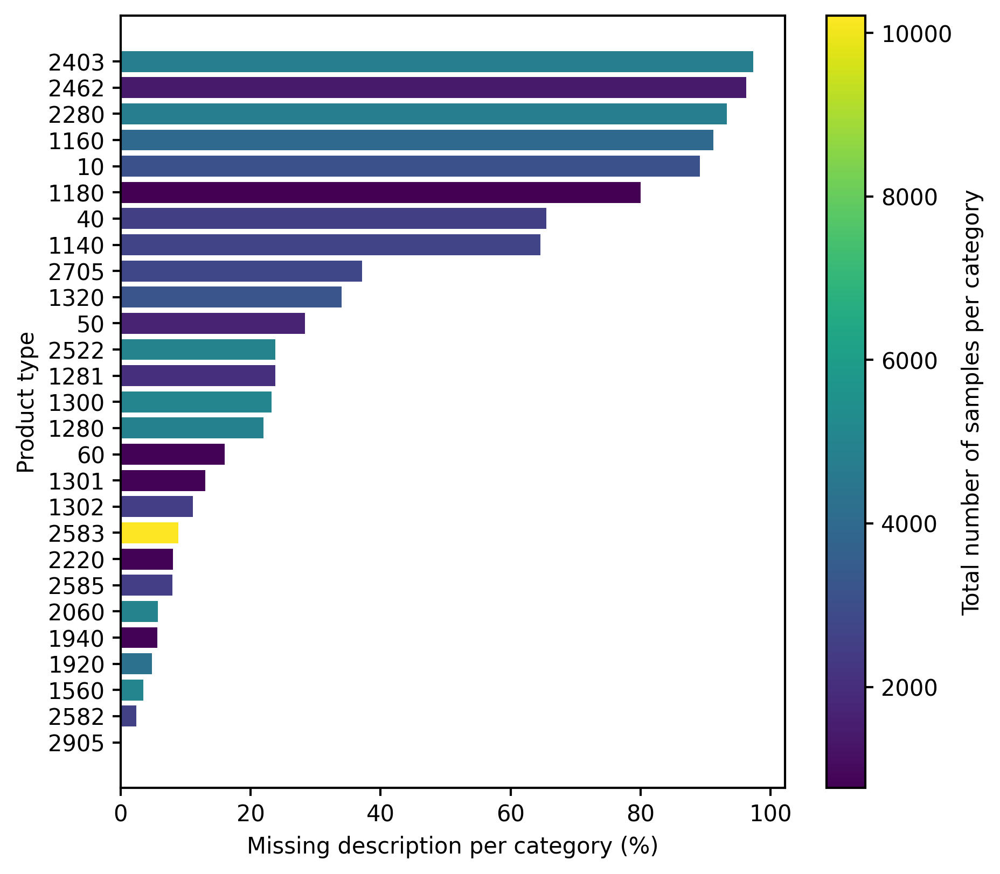

In [9]:
import matplotlib.pyplot as plt
import numpy as np

missing_desc = (
    df["description"].isna()
      .groupby(df["prdtypecode"])
      .agg(["mean", "sum", "count"])
      .rename(columns={
          "mean": "pct_missing",
          "sum": "n_missing",
          "count": "n_total"
      })
)

missing_desc["pct_missing"] = (missing_desc["pct_missing"] * 100).round(2)
missing_desc_sorted = missing_desc.sort_values("pct_missing", ascending=False)

# normalize counts for color mapping
counts = missing_desc_sorted["n_total"]
norm = (counts - counts.min()) / (counts.max() - counts.min())

cmap = plt.cm.viridis
colors = cmap(norm)

# create figure + axis explicitly
fig, ax = plt.subplots(figsize=(16*cm, 14*cm))

bars = ax.barh(
    missing_desc_sorted.index.astype(str),
    missing_desc_sorted["pct_missing"],
    color=colors
)

ax.set_xlabel("Missing description per category (%)")
ax.set_ylabel("Product type")
# ax.set_title("Percentage of Missing Descriptions per Product Type\nColor-coded by Total Number of Samples")

# invert y-axis so highest bar is on top
ax.invert_yaxis()

# create mappable for colorbar
sm = plt.cm.ScalarMappable(
    cmap=cmap,
    norm=plt.Normalize(vmin=counts.min(), vmax=counts.max())
)
sm.set_array([])

# attach colorbar to this axis
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label("Total number of samples per category")

plt.tight_layout()
plt.show()


# Manual exploration

## overview product types images for manual classification

In [10]:
# # for each prdtypecode, display 5 random images in a row 
# # print the text of the designation and description below each figure in a separate output in a formatted table


# unique_prdtypecodes = df['prdtypecode'].unique()
# num_images_per_code = 5

# for prdtypecode in unique_prdtypecodes:
#     sample_images = df[df['prdtypecode'] == prdtypecode].sample(num_images_per_code, random_state=47)
    
#     plt.figure(figsize=(15,3))
#     for i, (_, row) in enumerate(sample_images.iterrows()):
#         image_path = os.path.join(image_folder, row['image_file'])
#         image = cv2.imread(image_path)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
#         plt.subplot(1, num_images_per_code, i+1)
#         plt.imshow(image)
#         plt.title(f"ID: {row.name}", fontsize=10)
#         plt.axis('off')
        
#         print(f"ID: {row.name}\nDesignation: {row['designation']}\nDescription: {row['description']}\n")
    
#     plt.suptitle(f'Product Type Code: {prdtypecode}', fontsize=16)
#     plt.show()

## openai classification

In [11]:
def extract_product_keywords(
    df: pd.DataFrame,
    samples_per_code: int = 5,
    code_col: str = "prdtypecode",
    text_cols: tuple = ("designation", "description"),
    model: str = "gpt-4o-mini",
    temperature: float = 0.2,
):
    """
    Returns:
        { prdtypecode: "keyword1, keyword2, keyword3" }
    """

    product_keywords = {}

    for code, sub in df.groupby(code_col):
        sub = sub.dropna(subset=text_cols)
        if len(sub) == 0:
            continue

        samples = sub.sample(
            n=min(samples_per_code, len(sub)),
            random_state=42
        )

        joined_examples = "\n".join(
            f"- designation: {row['designation']}\n  description: {row['description']}"
            for _, row in samples.iterrows()
        )

        prompt = f"""
You are given product texts from ONE e-commerce category.

Task:
- Infer what kind of products these are
- Output EXACTLY 1 keyword or phrase
- use strictly an english keyword
- No brands
- No explanations

Product examples:
{joined_examples}

Output:
"""

        response = client.responses.create(
            model=model,
            input=prompt,
            temperature=temperature,
            max_output_tokens=30,
        )

        product_keywords[int(code)] = response.output_text.strip().lower()

    return product_keywords




In [12]:
product_keywords = extract_product_keywords(df, samples_per_code=30)

for code, kws in product_keywords.items():
    print(f"{code}: {kws}")


10: books
40: video games
50: gaming accessories
60: retro game console
1140: figurines
1160: trading cards
1180: magic tricks
1280: toys
1281: toys
1300: drones
1301: socks
1302: toys
1320: baby products
1560: home decor
1920: home decor
1940: food
2060: home decor
2220: pet supplies
2280: magazines
2403: books
2462: video game consoles
2522: stationery
2582: home and garden
2583: swimming pool equipment
2585: gardening tools
2705: books
2905: video games


In [91]:
# add a new column "product_keywords" to df which contains the keywords for each prdtypecode based on the product_keywords dictionary
df['product_keywords'] = df['prdtypecode'].map(product_keywords)

In [106]:
# print text of a given productid
product_id = 4151263409    # example productid
product_row = df[df['productid'] == product_id].iloc[0]
print("Designation:", product_row['designation'])

Designation: La Feuille D'aluminium De Cuisine Armoire Autocollant Étanche Selfadhesive Fond D'écran Vendu En Magasin Zhufuwme


### Category types

In [92]:
category_map = {
    10: "books",
    2280: "magazines",
    50: "gaming, electronics",
    1280: "toys, action figures",
    2705: "books",
    2522: "office supplies",
    2582: "garden, household",
    1560: "household,storage",
    1281: "toys",
    1920: "pillows, blankets",
    2403: "music, records",
    1140: "magnetic cards, little figures",
    2583: "swimming pool supplies",
    1180: "action figures and stuff",
    1300: "drones, automation",
    2462: "games, gaming consoles",
    1160: "yugiho cards",
    2060: "pillows, decorations, garden",
    40: "games, electronics",
    60: "pocket consoles, small games",
    1320: "bags, house hold",
    1302: "toys, sun glasses, accessories",
    2220: "animal stuff",
    2905: "gaming",
    2585: "technical stuff",
    1940: "food, sweets",
    1301: "table games"
}

# add a new column 'category' to df based on the prdtypecode using the category_map
df['category'] = df['prdtypecode'].map(category_map)
# number of unique product categories
num_unique_categories = df['prdtypecode'].nunique()
print(f"Number of unique product categories: {num_unique_categories}")
df.head()

Number of unique product categories: 27


,designation,description,productid,imageid,prdtypecode,image_file,category,text,lang_hf,lang_langdetect,char_len,token_len,product_keywords
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10,image_1263597046_product_3804725264.jpg,books,Olivia: Personalisiertes Notizbuch / 150 Seite...,de,de,89,14,books
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,2280,image_1008141237_product_436067568.jpg,magazines,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,fr,fr,207,39,magazines
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50,image_938777978_product_201115110.jpg,"gaming, electronics",Grand Stylet Ergonomique Bleu Gamepad Nintendo...,fr,fr,837,121,gaming accessories
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280,image_457047496_product_50418756.jpg,"toys, action figures",Peluche Donald - Europe - Disneyland 2000 (Mar...,fr,de,64,10,toys
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705,image_1077757786_product_278535884.jpg,books,La Guerre Des Tuques Luc a des id&eacute;es de...,fr,fr,234,38,books


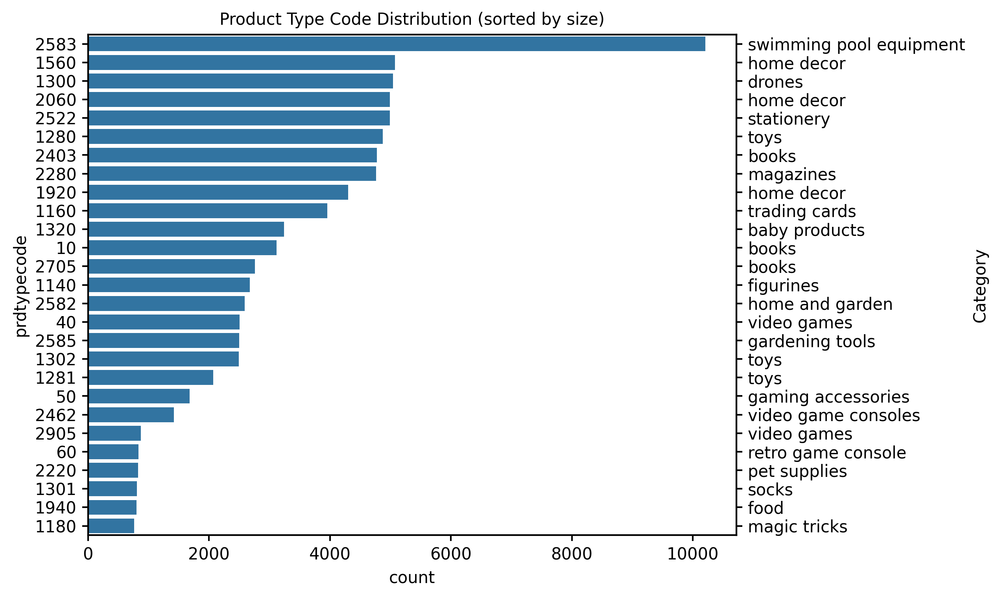

In [93]:
# order prdtypecode by descending frequency
order = (
    df["prdtypecode"]
    .value_counts()
    .sort_values(ascending=False)
    .index
)

plt.figure(figsize=(18*cm, 14*cm))

ax = sns.countplot(
    data=df,
    y="prdtypecode",
    order=order
)
ax.set_title("Product Type Code Distribution (sorted by size)")

# second y-axis with category names
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())

codes = [int(t.get_text()) for t in ax.get_yticklabels()]
# get only the first keyword from product_keywords
labels = [product_keywords.get(code, "") for code in codes]

ax2.set_yticks(ax.get_yticks())
ax2.set_yticklabels(labels)
ax2.set_ylabel("Category")

ax.grid(False)
ax2.grid(False)


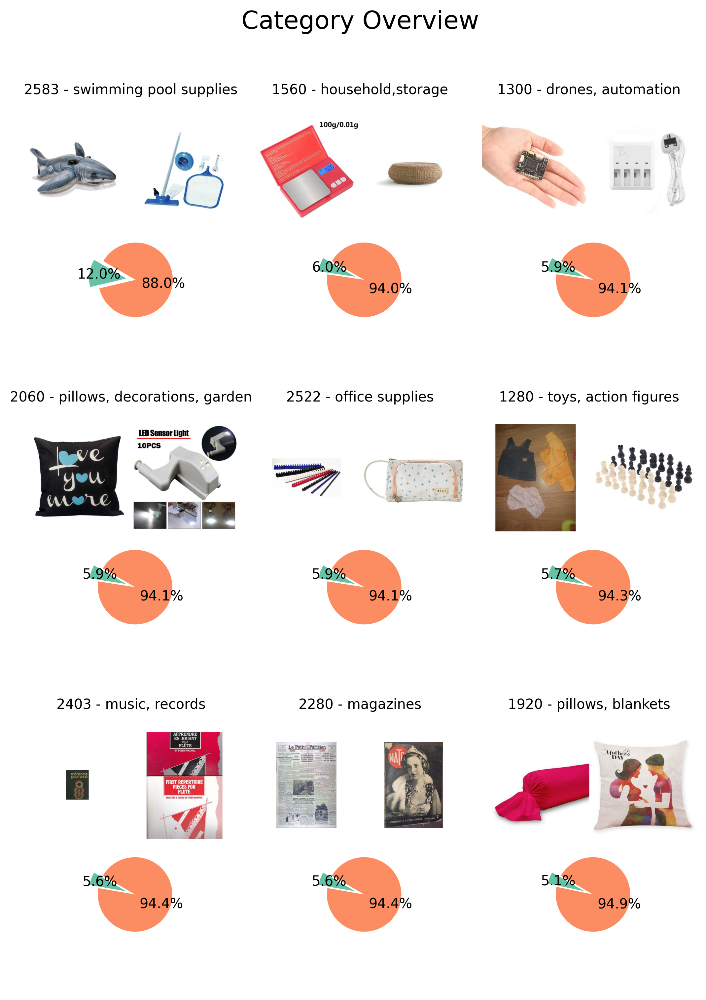

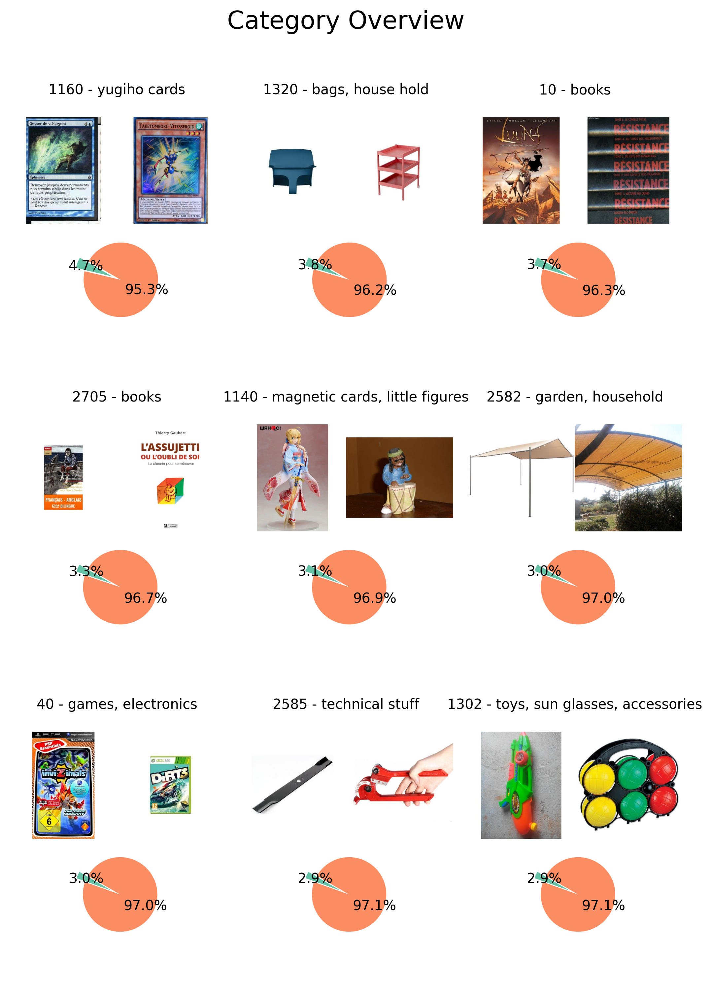

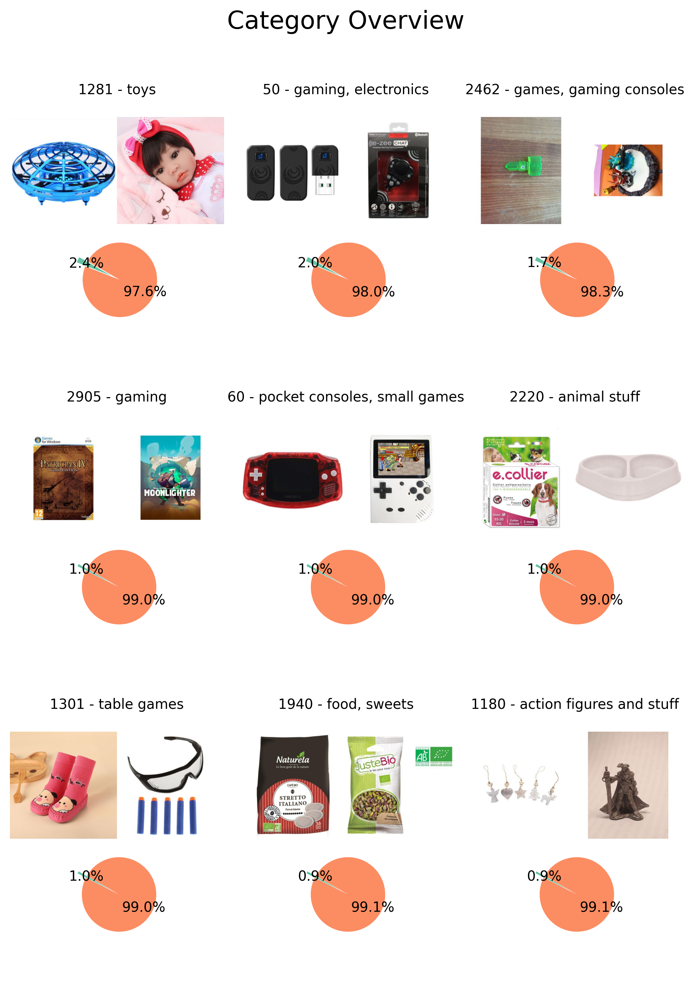

In [94]:
# choose one category
cat_counts_sorted = df["prdtypecode"].value_counts().index.tolist()
cats_page1 = cat_counts_sorted[:9]
cats_page2 = cat_counts_sorted[9:18]
cats_page3 = cat_counts_sorted[18:27]
category_pages = [cats_page1, cats_page2, cats_page3]


def plot_category_block(ax, prdtypecode):
    # sample 2 images
    sample_images = df[df['prdtypecode'] == prdtypecode].sample(2, random_state=11)

    # prepare images (your logic)
    imgs = []
    target_height = 1000
    for _, row in sample_images.iterrows():
        path = os.path.join(image_folder, row['image_file'])
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        h, w, _ = img.shape
        scale = target_height / h
        new_w = int(w * scale)
        img_resized = cv2.resize(img, (new_w, target_height))

        imgs.append(img_resized)

    combined = np.hstack(imgs)

    # category counts
    cat_count = df['prdtypecode'].value_counts()[prdtypecode]
    other_count = len(df) - cat_count
    sizes = [cat_count, other_count]

    # ------------------ plot into ax ------------------
    # Main image on top part of the axis: use inset axes
    ax_main = ax.inset_axes([0, 0.4, 1, 0.7])
    ax_main.imshow(combined)
    ax_main.axis("off")

    # Pie chart at bottom
    ax_pie = ax.inset_axes([0.25, 0.2, 0.5, 0.3])

    explode = (0.25, 0)
    colors = sns.color_palette("Set2")

    wedges, texts, autotexts = ax_pie.pie(
        sizes,
        explode=explode,
        # labels=[f"Category {prdtypecode}", ""],
        autopct='%1.1f%%',
        pctdistance=0.75,
        textprops={'fontsize': 9},
        startangle=150,
        colors=colors
    )

    for t in autotexts:
        t.set_color("black")
        t.set_fontsize(10)

    ax_pie.axis("equal")

    ax.set_title(f"{prdtypecode} - {df['category'].loc[df['prdtypecode'] == prdtypecode].iloc[0]}", fontsize=10)
    ax.axis("off")


for page_idx, category_list in enumerate(category_pages):
    fig, axes = plt.subplots(3, 3, figsize=(18*cm, 25*cm))  # big A4 layout
    axes = axes.flatten()

    for ax, prdtypecode in zip(axes, category_list):
        plot_category_block(ax, prdtypecode)

    # Hide empty subplots (if fewer than 9)
    for ax in axes[len(category_list):]:
        ax.axis("off")

    fig.suptitle(f"Category Overview", fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()



# Deeper Exploration of text data

## Combining designation and description

In [95]:
# # combine in one text cell the designation and description columns into a new column called "text_data"

df['text'] = df[['designation','description']].fillna('').agg(' '.join, axis=1)
display(df[['designation','description','text']].head())


,designation,description,text
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,Olivia: Personalisiertes Notizbuch / 150 Seite...
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,Grand Stylet Ergonomique Bleu Gamepad Nintendo...
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,Peluche Donald - Europe - Disneyland 2000 (Mar...
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,La Guerre Des Tuques Luc a des id&eacute;es de...


## Language exploration

### langdetect

In [ ]:
# import df which includes columns lang_hf and lang_langdetect (detected using Huggingface and langdetect) - done in a separate script
df_lang = pd.read_csv('data/rakuten_language_detection.csv', index_col=0)
df_lang = df_lang.reset_index()  # brings index_col=0 back as a column named like 'index' or the original name

display(df_lang.head())

# put the two new columns into the main df
df['lang_hf'] = df_lang['lang_hf']
df['lang_langdetect'] = df_lang['lang_langdetect']
display(df.head())

,designation,description,productid,imageid,prdtypecode,text,lang_hf,lang_langdetect
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10,Olivia: Personalisiertes Notizbuch / 150 Seite...,de,de
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,2280,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,fr,fr
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,fr,fr
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280,Peluche Donald - Europe - Disneyland 2000 (Mar...,fr,de
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705,La Guerre Des Tuques Luc a des id&eacute;es de...,fr,fr


,designation,description,productid,imageid,prdtypecode,image_file,category,text,lang_hf,lang_langdetect,char_len,token_len,product_keywords
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10,image_1263597046_product_3804725264.jpg,books,Olivia: Personalisiertes Notizbuch / 150 Seite...,de,de,89,14,books
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,2280,image_1008141237_product_436067568.jpg,magazines,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,fr,fr,207,39,magazines
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50,image_938777978_product_201115110.jpg,"gaming, electronics",Grand Stylet Ergonomique Bleu Gamepad Nintendo...,fr,fr,837,121,gaming accessories
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280,image_457047496_product_50418756.jpg,"toys, action figures",Peluche Donald - Europe - Disneyland 2000 (Mar...,fr,de,64,10,toys
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705,image_1077757786_product_278535884.jpg,books,La Guerre Des Tuques Luc a des id&eacute;es de...,fr,fr,234,38,books


### Visualization of language distribution

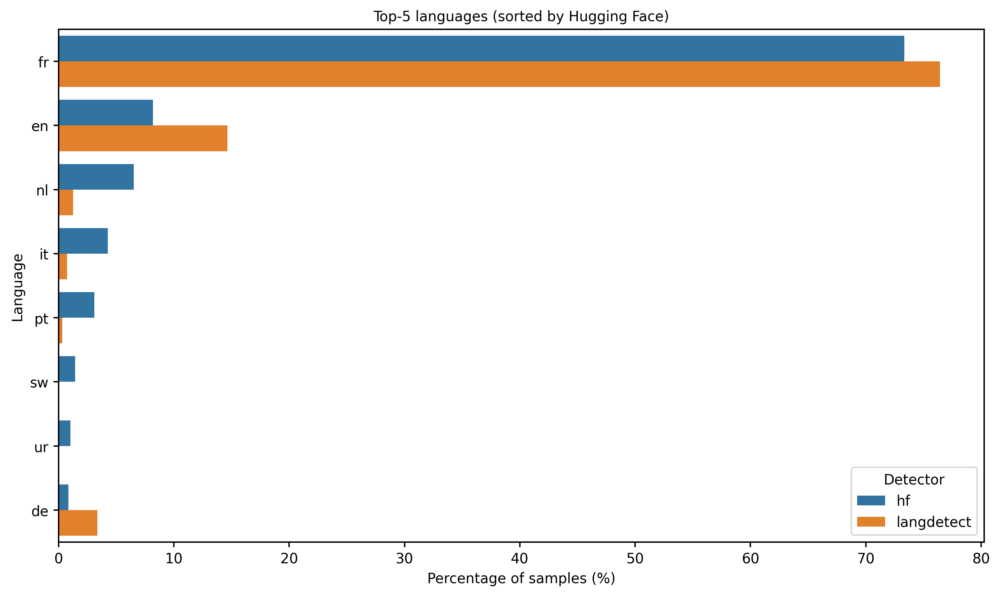

In [97]:
# HF
hf_pct = df["lang_hf"].value_counts(normalize=True).mul(100).reset_index()
hf_pct.columns = ["lang", "percent"]
hf_pct["detector"] = "hf"

# langdetect
ld_pct = df["lang_langdetect"].value_counts(normalize=True).mul(100).reset_index()
ld_pct.columns = ["lang", "percent"]
ld_pct["detector"] = "langdetect"

plot_df = pd.concat([hf_pct, ld_pct], ignore_index=True)

top_langs = (
    hf_pct.sort_values("percent", ascending=False)
          .head(8)["lang"]
          .tolist()
)

plot_df = plot_df[plot_df["lang"].isin(top_langs)]

lang_order = (
    hf_pct[hf_pct["lang"].isin(top_langs)]
    .sort_values("percent", ascending=False)["lang"]
    .tolist()
)
plt.figure(figsize=(10, 6))

sns.barplot(
    data=plot_df,
    y="lang",
    x="percent",
    hue="detector",
    order=lang_order,     # <-- critical line
    orient="h",
    errorbar=None,
)

plt.xlabel("Percentage of samples (%)")
plt.ylabel("Language")
plt.title("Top-5 languages (sorted by Hugging Face)")
plt.legend(title="Detector")
plt.tight_layout()
plt.show()


## Text length exploration

#### Character level

count    84916.000000
mean       595.719228
std        762.067621
min         12.000000
25%         66.000000
50%        314.000000
75%        904.000000
max      12536.000000
Name: char_len, dtype: float64


(0.0, 500.0)

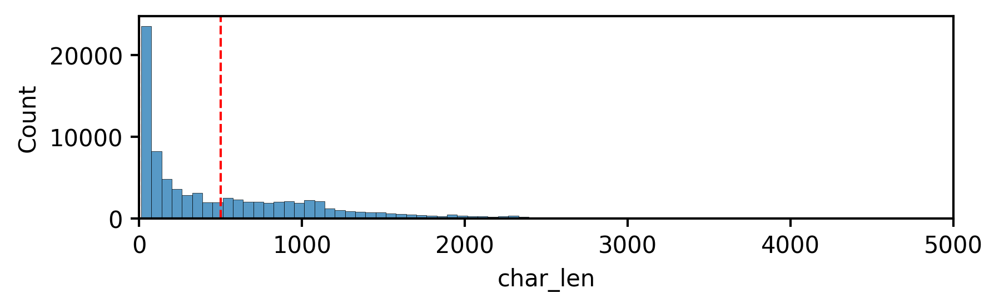

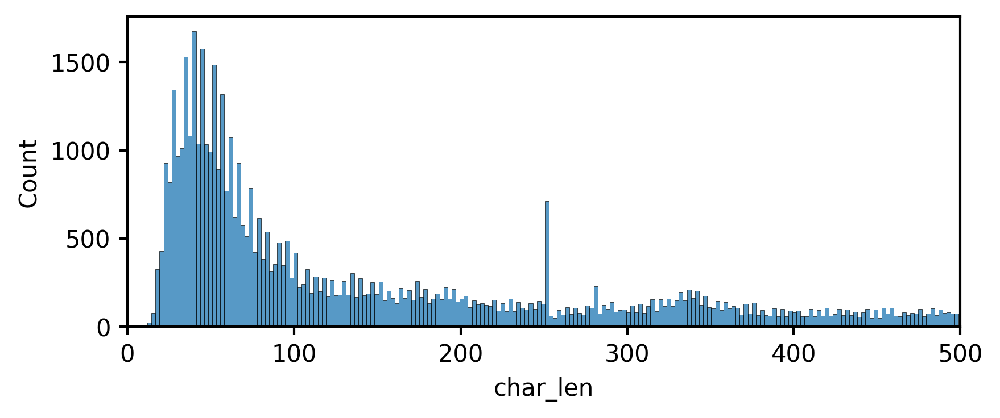

In [98]:
# character length distribution
df['char_len'] = df['text'].astype(str).apply(len)


plt.figure(figsize=(16*cm, 4*cm))
sns.histplot(data=df, x='char_len', bins=200)
# add a red dashed box between 0 and 500
plt.axvline(x=0, color='red', linestyle='--')
plt.axvline(x=500, color='red', linestyle='--')

plt.xlim(0, 5000)
# plt.yscale('log')

# print("=== Character Length Stats ===")
print(df['char_len'].describe())

# plot again but zoom into 0-500 range
plt.figure(figsize=(16*cm, 6*cm))
# extrac the data which is less than 500
df_less_500 = df[df['char_len'] < 500]
sns.histplot(data=df_less_500, x='char_len', bins=200)
plt.xlim(0, 500)

#### token level

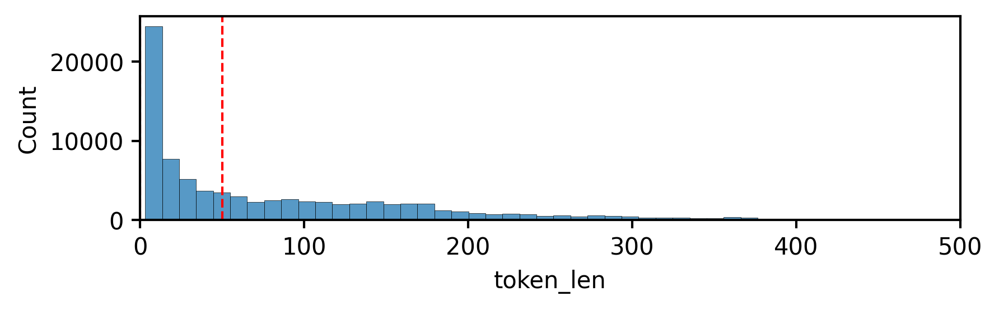

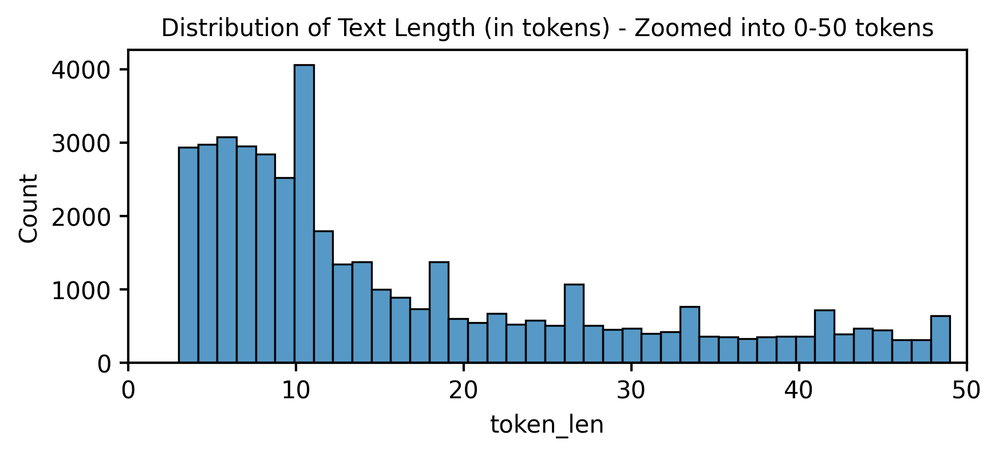

count    84916.000000
mean        91.724010
std        116.318779
min          3.000000
25%         11.000000
50%         48.000000
75%        137.000000
max       2078.000000
Name: token_len, dtype: float64


In [99]:
# white space tokenization length distribution
df['token_len'] = df['text'].astype(str).apply(lambda x: len(x.split()))

plt.figure(figsize=(16*cm,4*cm))
sns.histplot(data=df, x='token_len', bins=200)
plt.xlim(0, 500)
# add a red dashed box between 0 and 50
plt.axvline(x=0, color='red', linestyle='--')
plt.axvline(x=50, color='red', linestyle='--')
# plt.title("Distribution of Text Length (in tokens)")
# plt.yscale('log')
plt.show()


# zoom into 0-50 range in new figure
df_less_50tok = df[df['token_len'] < 50]
plt.figure(figsize=(16*cm,6*cm))
sns.histplot(data=df_less_50tok, x='token_len', bins=40)
plt.xlim(0, 50)
plt.title("Distribution of Text Length (in tokens) - Zoomed into 0-50 tokens")
plt.show()

print(df['token_len'].describe())



Text(0.5, 0, 'Language (Hugging Face)')

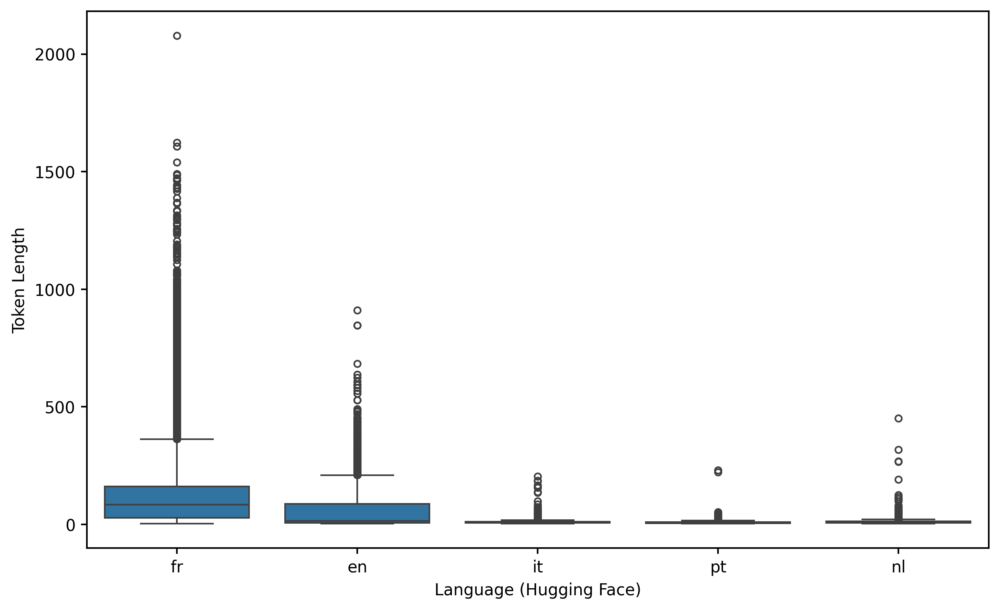

In [100]:
# box plot of token length per language for top 3 languages
top_languages = df['lang_hf'].value_counts().nlargest(5).index

plt.figure(figsize=(10,6))
sns.boxplot(data=df[df['lang_hf'].isin(top_languages)], x='lang_hf', y='token_len')
plt.ylabel("Token Length")
plt.xlabel("Language (Hugging Face)")
# plt.ylim(0, 300)

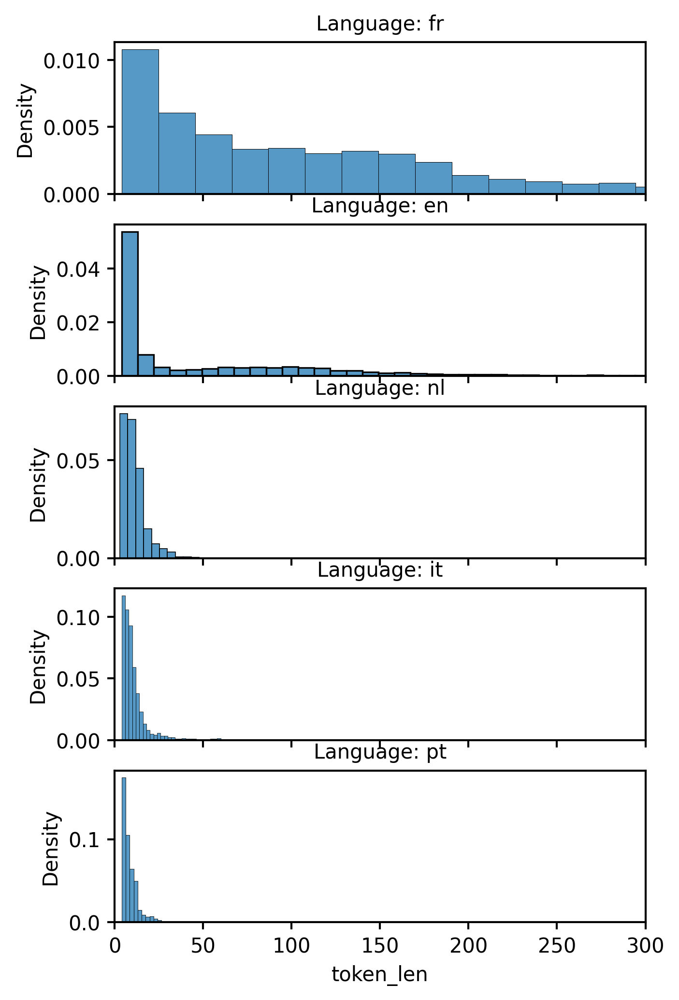

In [101]:
# distributions as histograms each of the five top languages in a separate plot with the shared x axis

top_languages = df['lang_hf'].value_counts().nlargest(5).index
fig, axes = plt.subplots(5, 1, figsize=(12*cm, 20*cm), sharex=True)

for ax, lang in zip(axes, top_languages):
    lang_data = df[df['lang_hf'] == lang]
    sns.histplot(data=lang_data, stat="density", x='token_len', bins=100, ax=ax)
    ax.set_title(f"Language: {lang}")
    ax.set_xlim(0, 300)
    ax.set_ylabel("Density")

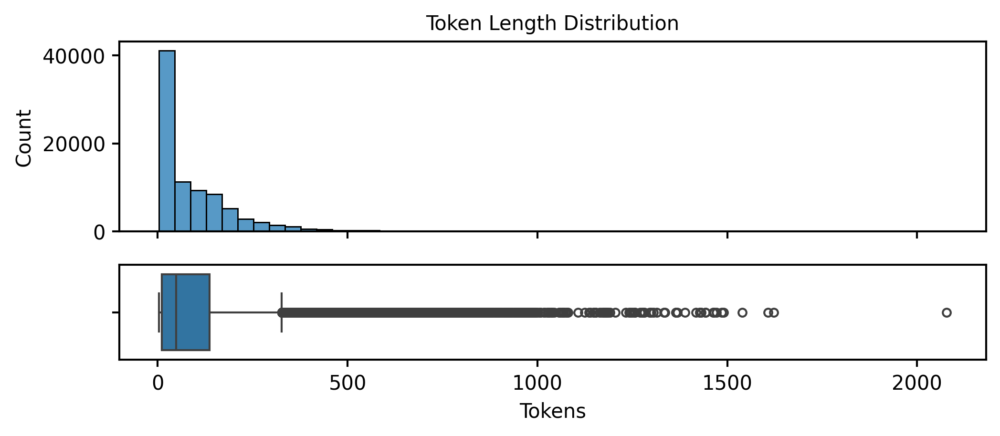

<Axes: xlabel='token_len'>

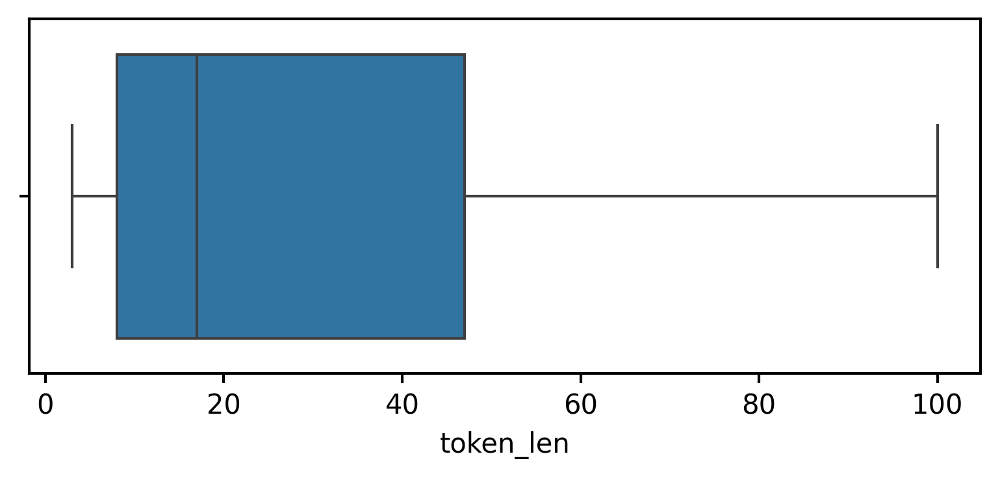

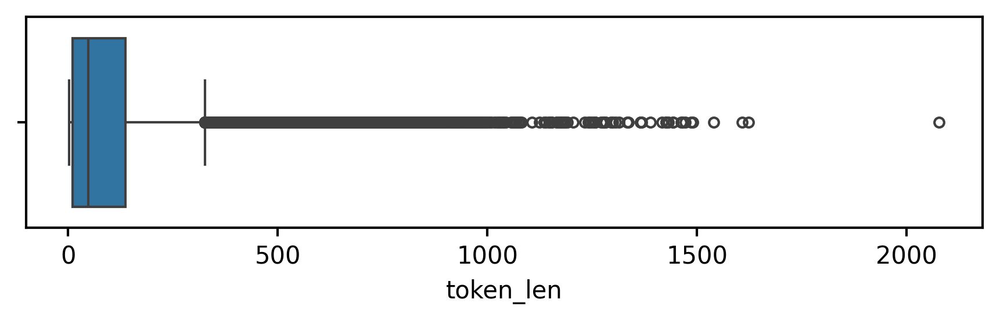

In [102]:
fig, axes = plt.subplots(2, 1, gridspec_kw={'height_ratios':[2,1]},sharex=True)

# Histogram
sns.histplot(df['token_len'], bins=50, ax=axes[0])
axes[0].set_title("Token Length Distribution")
axes[0].set_xlabel("Tokens")
axes[0].set_ylabel("Count")

# Boxplot
sns.boxplot(x=df['token_len'], ax=axes[1]) # such that there are no overlapping data points
axes[1].set_xlabel("Tokens")
# axes[1].set_title("Token Length - Boxplot")

plt.tight_layout()
plt.show()


# box plot for tokens with a maximum of 100 tokens
plt.figure(figsize=(16*cm,6*cm))
sns.boxplot(x=df[df['token_len'] <= 100]['token_len'])



df.describe()


# only plot the full boxplot
plt.figure(figsize=(18*cm,4*cm))
sns.boxplot(x=df['token_len'])

In [103]:
# display the language distribution
token_stats_by_type = df.groupby('prdtypecode')['token_len'].describe()
token_stats_by_type.sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
prdtypecode,,,,,,,,
1160,3953.0,11.817101,9.959289,4.0,7.00,10.0,13.00,119.0
2462,1421.0,11.946517,17.621848,4.0,6.00,9.0,14.00,427.0
2403,4774.0,12.977377,10.854248,3.0,7.00,10.0,15.00,136.0
10,3116.0,13.313543,21.404974,4.0,5.00,8.0,13.00,504.0
1140,2671.0,17.867091,23.780975,4.0,8.00,11.0,20.00,500.0
2280,4760.0,22.217227,19.279736,4.0,9.00,16.0,32.25,345.0
1180,764.0,31.140052,63.853453,4.0,6.00,9.0,14.00,499.0
40,2508.0,37.336922,62.793862,4.0,5.00,8.0,54.00,521.0
60,832.0,48.695913,53.115047,4.0,34.00,42.0,50.00,605.0


Text(0, 0.5, 'Category')

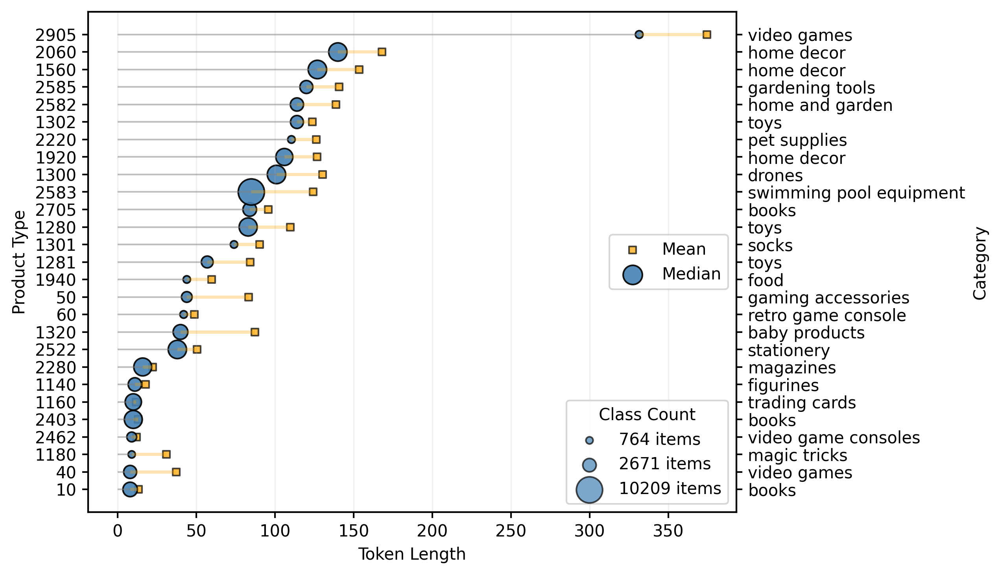

In [104]:
plt.figure(figsize=(18*cm, 14*cm))

agg = df.groupby('prdtypecode').agg(
    mean_len=('token_len','mean'),
    median_len=('token_len','median'),
    count=('prdtypecode','size')
).reset_index()

agg = agg.sort_values('median_len')

ax = plt.gca()

# Plot horizontal lines for median
plt.hlines(
    y=agg['prdtypecode'].astype(str),
    xmin=0,
    xmax=agg['median_len'],
    color='gray',
    alpha=0.5,
)

# Plot horizontal lines for mean
plt.hlines(
    y=agg['prdtypecode'].astype(str),
    xmin=agg['median_len'],
    xmax=agg['mean_len'],
    color='orange',
    alpha=0.3,
    linewidth=2,
)

# Scatter for median

# Scatter for mean
plt.scatter(
    agg['mean_len'],
    agg['prdtypecode'].astype(str),
    s = 20,
    color='orange',
    alpha=0.7,
    edgecolor='black',
    marker='s',
    label='Mean'
)

plt.scatter(
    agg['median_len'],
    agg['prdtypecode'].astype(str),
    s=agg['count'] / 40,
    color='steelblue',
    alpha=0.9,
    edgecolor='black',
    label='Median'
)
plt.xlabel("Token Length")
plt.ylabel("Product Type")
plt.grid(axis='x', alpha=0.2)

sizes = [agg['count'].min(), agg['count'].median(), agg['count'].max()]
markers = []
for s in sizes:
    markers.append(
        plt.scatter([], [], s=s/40, color="steelblue", alpha=0.7, edgecolor="black")
    )

legend1 = plt.legend(
    handles=markers,
    labels=[f"{int(s)} items" for s in sizes],
    title="Class Count",
    loc="lower right",
    frameon=True
)

plt.legend(loc="center right", frameon=True)
ax.add_artist(legend1)

ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())

codes = [int(t.get_text()) for t in ax.get_yticklabels()]
labels = [product_keywords.get(code, "") for code in codes]

ax2.set_yticks(ax.get_yticks())
ax2.set_yticklabels(labels)
ax2.set_ylabel("Category")


In [105]:
# save df to csv
df.to_csv('data/rakuten_explored.csv', index=False)